<a href="https://colab.research.google.com/github/cboyda/MachineLearning/blob/main/PA2_Team1_W23_ipynd.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **PA2: Data**

Team member names:

*  Brett Adams
*  Cailenys Leslie
*  Clinton Boyda
*  Tanvir Hossain
*  Ram Dershan

Dataset: 
[New York City Airbnb Open Data](https://www.kaggle.com/datasets/dgomonov/new-york-city-airbnb-open-data)

# Data Inspection: Setup

In [63]:
import numpy as np
import pandas as pd
import plotly.express as px
import seaborn as sns

In [64]:
# Connect to Dataset

filename = "https://raw.githubusercontent.com/cboyda/MachineLearning/main/AB_NYC_2019.csv"

df = pd.read_csv(filename)

# DI: Data Inspection

## DI: Question 1
Check the features that are listed in your dataset. Consider the different values, what measurements they each represent and if there is any information missing about the measurement of those values. This may require some research.

In [65]:
df.dtypes

id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group                object
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
dtype: object

In [66]:
df.columns

Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood_group',
       'neighbourhood', 'latitude', 'longitude', 'room_type', 'price',
       'minimum_nights', 'number_of_reviews', 'last_review',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365'],
      dtype='object')

Break apart the features (columns) into feature names and label name.

In [67]:
# make a list of names for the features
feature_names = ["id", "name", "host_id","host_name", "neighbourhood_group",
                 "neighbourhood", "latitude", "longitude", "room_type",
                 "minimum_nights", "number_of_reviews", "last_review", "reviews_per_month",
                 "calculated_host_listings_count","availability_365"]

# label name
label_name = "price"
# combine feature names and label name into a single list for pandas to use
column_names = feature_names + [label_name]

In [68]:
df.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,4.889500e+04,4.889500e+04,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,38843.000000,48895.000000,48895.000000
mean,1.901714e+07,6.762001e+07,40.728949,-73.952170,152.720687,7.029962,23.274466,1.373221,7.143982,112.781327
std,1.098311e+07,7.861097e+07,0.054530,0.046157,240.154170,20.510550,44.550582,1.680442,32.952519,131.622289
min,2.539000e+03,2.438000e+03,40.499790,-74.244420,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,9.471945e+06,7.822033e+06,40.690100,-73.983070,69.000000,1.000000,1.000000,0.190000,1.000000,0.000000
50%,1.967728e+07,3.079382e+07,40.723070,-73.955680,106.000000,3.000000,5.000000,0.720000,1.000000,45.000000
75%,2.915218e+07,1.074344e+08,40.763115,-73.936275,175.000000,5.000000,24.000000,2.020000,2.000000,227.000000
max,3.648724e+07,2.743213e+08,40.913060,-73.712990,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


## DI: Question 2
Print a portion of the dataset (or all if it’s a small dataset) to familiarize yourself with the information in the dataset.

In [69]:
df.dtypes

id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group                object
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
dtype: object

In [70]:
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


In [71]:
df.tail()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
48890,36484665,Charming one bedroom - newly renovated rowhouse,8232441,Sabrina,Brooklyn,Bedford-Stuyvesant,40.67853,-73.94995,Private room,70,2,0,NaN,NaN,2,9
48891,36485057,Affordable room in Bushwick/East Williamsburg,6570630,Marisol,Brooklyn,Bushwick,40.70184,-73.93317,Private room,40,4,0,NaN,NaN,2,36
48892,36485431,Sunny Studio at Historical Neighborhood,23492952,Ilgar & Aysel,Manhattan,Harlem,40.81475,-73.94867,Entire home/apt,115,10,0,NaN,NaN,1,27
48893,36485609,43rd St. Time Square-cozy single bed,30985759,Taz,Manhattan,Hell's Kitchen,40.75751,-73.99112,Shared room,55,1,0,NaN,NaN,6,2
48894,36487245,Trendy duplex in the very heart of Hell's Kitchen,68119814,Christophe,Manhattan,Hell's Kitchen,40.76404,-73.98933,Private room,90,7,0,NaN,NaN,1,23


## DI: Question 3
What is the **`shape`** of your data?

In [72]:
df.shape

(48895, 16)

In [73]:
len(df)

48895

Further break down size of dataset.

In [74]:
# get number of examples
m = len(df)
# get number of features
nc = len(df.columns) - 1

# display them
print("Number of Examples:", m)
print("Number Features:", nc, "plus 1 label column.")


Number of Examples: 48895
Number Features: 15 plus 1 label column.


# DAFE: Data Analysis & Feature Engineering

## DAFE: Question 1
List the features that are **categorical**.

In [75]:
df.select_dtypes(include=['object']).head()

,name,host_name,neighbourhood_group,neighbourhood,room_type,last_review
0,Clean & quiet apt home by the park,John,Brooklyn,Kensington,Private room,2018-10-19
1,Skylit Midtown Castle,Jennifer,Manhattan,Midtown,Entire home/apt,2019-05-21
2,THE VILLAGE OF HARLEM....NEW YORK !,Elisabeth,Manhattan,Harlem,Private room,NaN
3,Cozy Entire Floor of Brownstone,LisaRoxanne,Brooklyn,Clinton Hill,Entire home/apt,2019-07-05
4,Entire Apt: Spacious Studio/Loft by central park,Laura,Manhattan,East Harlem,Entire home/apt,2018-11-19


In [76]:
# for label, content in df.items():
#     if pd.api.types.is_string_dtype(content):
#         print(label)

In [77]:
from pandas.core.arrays import categorical
n = df["neighbourhood_group"].unique()
neighbourhood_groups = pd.CategoricalDtype(categories = n)
df['neighbourhood_group'] = df['neighbourhood_group'].astype(neighbourhood_groups)

In [78]:
neighbourhood = df["neighbourhood"].unique()
nb = pd.CategoricalDtype(categories = neighbourhood)
df['neighbourhood'] = df['neighbourhood'].astype(nb)

In [79]:
room_type = pd.CategoricalDtype(categories = ["Private room", "Entire home/apt", "Shared room"])
df["room_type"] = df['room_type'].astype(room_type)

In [80]:
df.dtypes

id                                   int64
name                                object
host_id                              int64
host_name                           object
neighbourhood_group               category
neighbourhood                     category
latitude                           float64
longitude                          float64
room_type                         category
price                                int64
minimum_nights                       int64
number_of_reviews                    int64
last_review                         object
reviews_per_month                  float64
calculated_host_listings_count       int64
availability_365                     int64
dtype: object

In [81]:
df.select_dtypes(include=['category']).head()

,neighbourhood_group,neighbourhood,room_type
0,Brooklyn,Kensington,Private room
1,Manhattan,Midtown,Entire home/apt
2,Manhattan,Harlem,Private room
3,Brooklyn,Clinton Hill,Entire home/apt
4,Manhattan,East Harlem,Entire home/apt


In [82]:
# Changing "last_review category" to numeric data type is not necessary, since date is a special type of object.

## DAFE: Question 2
List the features that are **numeric**.

In [83]:
df.select_dtypes(include=['int64','float64']).head()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,2787,40.64749,-73.97237,149,1,9,0.21,6,365
1,2595,2845,40.75362,-73.98377,225,1,45,0.38,2,355
2,3647,4632,40.80902,-73.94190,150,3,0,NaN,1,365
3,3831,4869,40.68514,-73.95976,89,1,270,4.64,1,194
4,5022,7192,40.79851,-73.94399,80,10,9,0.10,1,0


id, host_id, and reviews_per_month are listed here however they won't be used as features.

In [84]:
df.count(axis=1).head()

0    16
1    16
2    14
3    16
4    16
dtype: int64

In [85]:
df.select_dtypes(include=['int64','float64']).count()

id                                48895
host_id                           48895
latitude                          48895
longitude                         48895
price                             48895
minimum_nights                    48895
number_of_reviews                 48895
reviews_per_month                 38843
calculated_host_listings_count    48895
availability_365                  48895
dtype: int64

## DAFE: Question 3
List the feature that will be your **label**.

In [86]:
label_name

'price'

## DAFE: Q4

### Q4a
Look for and list any immediate **issues** in your dataset.

(a) Missing Values

In [87]:
#do missing values exist, as boolean question
result = df.isnull().sum().sum()
result > 0

True

In [88]:
# show how manyu nulls are found in each column
df.isnull().sum()

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

Percentage of missing:

In [89]:
100*(df.isnull().sum())/len(df)

id                                 0.000000
name                               0.032723
host_id                            0.000000
host_name                          0.042949
neighbourhood_group                0.000000
neighbourhood                      0.000000
latitude                           0.000000
longitude                          0.000000
room_type                          0.000000
price                              0.000000
minimum_nights                     0.000000
number_of_reviews                  0.000000
last_review                       20.558339
reviews_per_month                 20.558339
calculated_host_listings_count     0.000000
availability_365                   0.000000
dtype: float64

Count of NaN

In [90]:
count_nan_in_df = df.isnull().sum().sum()
print ('Count of NaN: ' + str(count_nan_in_df))

Count of NaN: 20141


In [91]:
nan_values = df[df.isna().any(axis=1)]
nan_values.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
19,7750,Huge 2 BR Upper East Cental Park,17985,Sing,Manhattan,East Harlem,40.79685,-73.94872,Entire home/apt,190,7,0,NaN,NaN,2,249
26,8700,Magnifique Suite au N de Manhattan - vue Cloitres,26394,Claude & Sophie,Manhattan,Inwood,40.86754,-73.92639,Private room,80,4,0,NaN,NaN,1,0
36,11452,Clean and Quiet in Brooklyn,7355,Vt,Brooklyn,Bedford-Stuyvesant,40.68876,-73.94312,Private room,35,60,0,NaN,NaN,1,365
38,11943,Country space in the city,45445,Harriet,Brooklyn,Flatbush,40.63702,-73.96327,Private room,150,1,0,NaN,NaN,1,365


In [92]:
nan_values.tail()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
48890,36484665,Charming one bedroom - newly renovated rowhouse,8232441,Sabrina,Brooklyn,Bedford-Stuyvesant,40.67853,-73.94995,Private room,70,2,0,NaN,NaN,2,9
48891,36485057,Affordable room in Bushwick/East Williamsburg,6570630,Marisol,Brooklyn,Bushwick,40.70184,-73.93317,Private room,40,4,0,NaN,NaN,2,36
48892,36485431,Sunny Studio at Historical Neighborhood,23492952,Ilgar & Aysel,Manhattan,Harlem,40.81475,-73.94867,Entire home/apt,115,10,0,NaN,NaN,1,27
48893,36485609,43rd St. Time Square-cozy single bed,30985759,Taz,Manhattan,Hell's Kitchen,40.75751,-73.99112,Shared room,55,1,0,NaN,NaN,6,2
48894,36487245,Trendy duplex in the very heart of Hell's Kitchen,68119814,Christophe,Manhattan,Hell's Kitchen,40.76404,-73.98933,Private room,90,7,0,NaN,NaN,1,23


Combining counts with percentages we get:

In [93]:
def describe_nan(df):
    return pd.DataFrame([(i, df[df[i].isna()].shape[0],df[df[i].isna()].shape[0]/df.shape[0]*100) for i in df.columns], columns=['column', 'nan_count', 'nan_percentage'])

describe_nan(df)

,column,nan_count,nan_percentage
0,id,0,0.000000
1,name,16,0.032723
2,host_id,0,0.000000
3,host_name,21,0.042949
4,neighbourhood_group,0,0.000000
5,neighbourhood,0,0.000000
6,latitude,0,0.000000
7,longitude,0,0.000000
8,room_type,0,0.000000
9,price,0,0.000000


In [94]:
df.info(show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype   
---  ------                          --------------  -----   
 0   id                              48895 non-null  int64   
 1   name                            48879 non-null  object  
 2   host_id                         48895 non-null  int64   
 3   host_name                       48874 non-null  object  
 4   neighbourhood_group             48895 non-null  category
 5   neighbourhood                   48895 non-null  category
 6   latitude                        48895 non-null  float64 
 7   longitude                       48895 non-null  float64 
 8   room_type                       48895 non-null  category
 9   price                           48895 non-null  int64   
 10  minimum_nights                  48895 non-null  int64   
 11  number_of_reviews               48895 non-null  int64   
 12  last_review       

In [95]:
# total NaN values in dataset
# https://datatofish.com/check-nan-pandas-dataframe/
count_nan_in_df = df.isnull().sum().sum()
print ('Count of NaN: ' + str(count_nan_in_df))

Count of NaN: 20141


In [96]:
# count NaN by column
# https://datatofish.com/check-nan-pandas-dataframe/
count_nan_in_df = df.isnull().sum()
print (count_nan_in_df)

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64


In [97]:
# list only columns that have NaN...
nan_values = df[df.isna().any(axis=1)]
nan_values.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
19,7750,Huge 2 BR Upper East Cental Park,17985,Sing,Manhattan,East Harlem,40.79685,-73.94872,Entire home/apt,190,7,0,NaN,NaN,2,249
26,8700,Magnifique Suite au N de Manhattan - vue Cloitres,26394,Claude & Sophie,Manhattan,Inwood,40.86754,-73.92639,Private room,80,4,0,NaN,NaN,1,0
36,11452,Clean and Quiet in Brooklyn,7355,Vt,Brooklyn,Bedford-Stuyvesant,40.68876,-73.94312,Private room,35,60,0,NaN,NaN,1,365
38,11943,Country space in the city,45445,Harriet,Brooklyn,Flatbush,40.63702,-73.96327,Private room,150,1,0,NaN,NaN,1,365


### Q4b
Look for and list any immediate **issues** in your dataset.

(b) Duplicate data

In [98]:
duplicate_rows = df.duplicated()

display(duplicate_rows.any())

False

### Q4c
Look for and list any immediate **issues** in your dataset.

(c) Misalignment of values and columns

In [99]:
df.head(80)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75,18127,Charming East Village One Bedroom Flat,69829,Josh,Manhattan,East Village,40.72828,-73.98801,Entire home/apt,190,5,21,2019-01-02,0.20,1,224
76,18152,Manhattan Room,69942,Victoria,Manhattan,Upper East Side,40.76865,-73.95058,Private room,200,1,142,2019-07-06,1.50,1,322
77,18198,Little King of Queens,70091,Justin,Queens,Woodside,40.75038,-73.90334,Private room,70,30,25,2019-05-31,0.22,1,324
78,18590,Fort Greene Retreat on the Park,71512,Blaise,Brooklyn,Fort Greene,40.69320,-73.97267,Private room,95,3,143,2019-06-16,1.28,1,132


🚩 Conclusion of visual review: No rows seem misaligned.

---



## DAFE: Univariate Q5

In [100]:
#dropping columns that are not significant or could be unethical to use for our future data exploration and predictions
#df.drop(['id','host_name','last_review'], axis=1, inplace=True)

In [101]:
#replacing all NaN values in 'reviews_per_month' with 0
#df.fillna({'reviews_per_month':0}, inplace=True)

In [102]:
#show unique values for analytis
df.neighbourhood_group.unique()

['Brooklyn', 'Manhattan', 'Queens', 'Staten Island', 'Bronx']
Categories (5, object): ['Brooklyn', 'Manhattan', 'Queens', 'Staten Island', 'Bronx']

In [103]:
df.neighbourhood.unique()

['Kensington', 'Midtown', 'Harlem', 'Clinton Hill', 'East Harlem', ..., 'Bull's Head', 'New Dorp', 'Rossville', 'Breezy Point', 'Willowbrook']
Length: 221
Categories (221, object): ['Kensington', 'Midtown', 'Harlem', 'Clinton Hill', ..., 'New Dorp',
                           'Rossville', 'Breezy Point', 'Willowbrook']

In [104]:
df.room_type.unique()

['Private room', 'Entire home/apt', 'Shared room']
Categories (3, object): ['Private room', 'Entire home/apt', 'Shared room']

Reduce feature names to compare.

In [105]:
feature_names

['id',
 'name',
 'host_id',
 'host_name',
 'neighbourhood_group',
 'neighbourhood',
 'latitude',
 'longitude',
 'room_type',
 'minimum_nights',
 'number_of_reviews',
 'last_review',
 'reviews_per_month',
 'calculated_host_listings_count',
 'availability_365']

In [106]:
feature_names = "neighbourhood_group","neighbourhood","room_type"

In [107]:
feature_names

('neighbourhood_group', 'neighbourhood', 'room_type')

In [108]:
df.select_dtypes(include=['int64','float64']).head()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,2787,40.64749,-73.97237,149,1,9,0.21,6,365
1,2595,2845,40.75362,-73.98377,225,1,45,0.38,2,355
2,3647,4632,40.80902,-73.94190,150,3,0,NaN,1,365
3,3831,4869,40.68514,-73.95976,89,1,270,4.64,1,194
4,5022,7192,40.79851,-73.94399,80,10,9,0.10,1,0


In [109]:
numerical_features = "id","host_id","latitude","longitude","minimum_nights","number_of_reviews","reviews_per_month","calculated_host_listings_count","availability_365"

In [110]:
for feature in feature_names:
  fig = px.histogram(df, x=feature, color=label_name, marginal="box")
  fig.update_layout(height=300, margin=dict(l=0, r=0, t=0, b=0))
  fig.show()

In [111]:
#setting figure size for future visualizations
sns.set(rc={'figure.figsize':(10,8)})
sns.set_style('white')

Text(0.5, 1.0, 'Density and distribution of prices for each neighberhood_group')

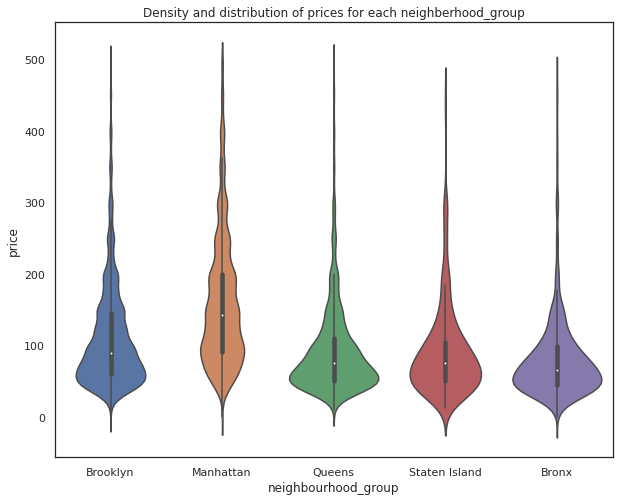

In [112]:
#we can see from our statistical table that we have some extreme values, therefore we need to remove them for the sake of a better visualization

#creating a sub-dataframe with no extreme values / less than 500
sub_6=df[df.price < 500]
#using violinplot to showcase density and distribtuion of prices 
viz_2=sns.violinplot(data=sub_6, x='neighbourhood_group', y='price')
viz_2.set_title('Density and distribution of prices for each neighberhood_group')

Great, with a statistical table and a violin plot we can definitely observe a couple of things about distribution of prices for Airbnb in NYC boroughs. First, we can state that Manhattan has the highest range of prices for the listings with $150 price as average observation, followed by Brooklyn with \$90 per night. Queens and Staten Island appear to have very similar distributions, Bronx is the cheapest of them all. This distribution and density of prices were completely expected; for example, as it is no secret that Manhattan is one of the most expensive places in the world to live in, where Bronx on other hand appears to have lower standards of living.

### Q5a
Univariate: Plot the **histograms** and **box-and-whisker plot** for each feature in your dataset.

(a) List the features that seem to have a Gaussian distribution.


**The features we used don't seem to have a Gaussian distribution, so we demonstrate it below with our label**

In [113]:
import matplotlib.pyplot as plt

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



Text(0.5, 1.0, 'Price Distribution Plot')

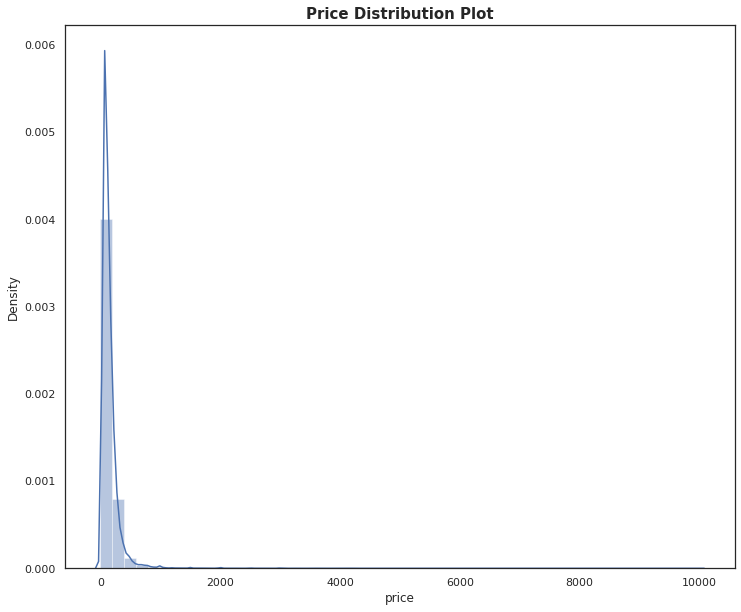

In [114]:
plt.figure(figsize=(12,10))
sns.distplot(df['price'])
plt.title("Price Distribution Plot",size=15, weight='bold')



The price distribution graph shows that there is a right-skewed distribution on price. This means there is a positive skewness. Log transformation will be used to make this feature less skewed. This will help to make easier interpretation and better statistical analysis

Since division by zero is a problem, log+1 transformation would be b

In [115]:
df['price_log'] = np.log(df.price+1)


With help of log transformation, now, price feature have normal distribution.

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



Text(0.5, 1.0, 'Log-Price Distribution Plot')

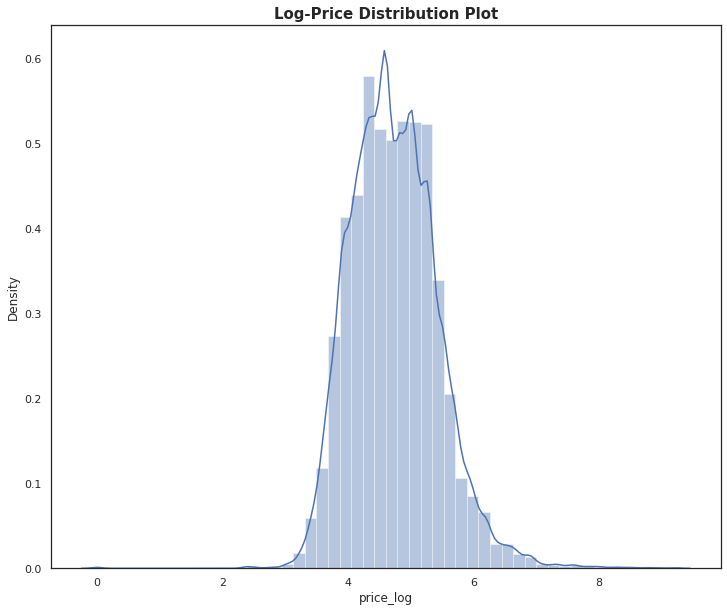

In [116]:
plt.figure(figsize=(12,10))
sns.distplot(df['price_log'])
plt.title("Log-Price Distribution Plot",size=15, weight='bold')

In [117]:
#for feature in numerical_features:
fig = px.histogram(df['price_log'], marginal="box")
fig.show()

### Q5b
Univariate: Plot the **histograms** and **box-and-whisker plot** for each feature in your dataset.

(b) List the features whose box-and-whiskers plot show outliers.


In [118]:
for feature in numerical_features:
  fig = px.histogram(df, x=feature, marginal="box")
  fig.show()

### Q5c
Univariate: Plot the **histograms** and **box-and-whisker plot** for each feature in your dataset.

(c) List the features whose box-and-whiskers plot show outliers that you think might be of concern and why.

**Outliers do not affect our prediction model since they occur in features that we will consider dropping**

## DAFE: Bivariate Analysis Q6

### Bivariate Analysis Q6a
Bivariate: Plot a **scatter matrix**

(a) List the features that have binary values.

In [119]:
#assuming 'binary values' == numeric values
df.select_dtypes(include=['int64','float64']).head()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,price_log
0,2539,2787,40.64749,-73.97237,149,1,9,0.21,6,365,5.010635
1,2595,2845,40.75362,-73.98377,225,1,45,0.38,2,355,5.420535
2,3647,4632,40.80902,-73.94190,150,3,0,NaN,1,365,5.017280
3,3831,4869,40.68514,-73.95976,89,1,270,4.64,1,194,4.499810
4,5022,7192,40.79851,-73.94399,80,10,9,0.10,1,0,4.394449


**We don't have any features with binary values, however, after encoding categorical features we will have binary values**

### Bivariate Analysis Q6b
Bivariate: Plot a **scatter matrix**

(b) List the features that have a positive or negative correlation.

**The only correlations are longitude and latitude**

In [121]:
fig = px.scatter_matrix(df, dimensions=numerical_features)

fig.update_layout(width= (nc + 1) * 200,
                 height= (nc + 1) * 200,
                 margin=dict(l=0, r=0, t=0, b=0))

fig.show()

In [122]:
#sample from  https://stackoverflow.com/questions/66572672/correlation-heatmap-in-plotly
# Correlation
df_corr = df.corr().round(1)  
# Mask to matrix
mask = np.zeros_like(df_corr, dtype=bool)
mask[np.triu_indices_from(mask)] = True
# Viz
df_corr_viz = df_corr.mask(mask).dropna(how='all').dropna(how='all')
# colour variable https://plotly.com/python/colorscales/
fig = px.imshow(df_corr_viz, text_auto=True, color_continuous_scale=[(0.00, "black"),   (0.33, "black"),
                                                     (0.33, "white"), (0.66, "white"),
                                                     (0.66, "blue"),  (1.00, "blue")])
fig.show()

#selecteable checkboxes available using dash on https://plotly.com/python/heatmaps/

## DAFE: Feature Engineering Q7

### Q7a
Given the above analysis, what features do you need to: 

(a) Encode
- neighbourhood_group
- room_type

### Q7b
Given the above analysis, what features do you need to: 

(b) Aggregate 

- longitude
- latitude


### Q7c
Given the above analysis, what features do you need to: 

(c) Decompose 
- date features if we wish to further analysis time comparisons


### Q7d
Given the above analysis, what features do you need to: 

(d) Scale

- calculated_host_listings (perform robust scalar method)

### Q7e
Given the above analysis, what features do you need to: 

(e) Transform

- price (this is our label, our features don't require any transformation)

# Section 3 DAU: Data Acquisition & Understanding


## DAU: Question 1
Consider the dataset you now have, are there additional dataset(s) that you could use to
augment the existing set of information contained in your current data in order to improve
the accuracy of your future ML models? **List at least one dataset.** This will require some
research; we recommend browsing datasets on Kaggle. Note: Your team will NOT be
expected to use this dataset(s). This is an exercise to inform your future model building.

**http://data.insideairbnb.com/united-states/ny/new-york-city/2022-12-04/data/listings.csv.gz**

**http://ftp.extremesolutions.org/upload/listings.csv**


## DAU: Question 2
Consider your problem definition and what you’ve learned after completing your data analysis & feature engineering. Is an **update in problem definition, outcome, action, judgement, context, or ethical concerns needed**? (Address each element in this list.)

###Problem Definition

  - we can calculate average price (per area)
  - we can calculate availability (per area)

###Outcome

- predicting price

###Action

- analyze new data for consideration

###Judgement

- judgments remain the same as before

###Context

- context remains the same as before

###Ethical Concerns

- Ethical concerns remain the same as before